<a href="https://colab.research.google.com/github/11SyamSM/amikom/blob/main/CV_RTM4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Computer Vision - RTM 4 - (Feature, Finding Corner & Invariance)

Mata Kuliah : **Computer Vision (CV)**

Dosen Pengampu : **Dr. Arief Setyanto, S.Si., M.T.**

Tutor : **Rizqi Sukma Kharisma, M.Kom.**




**Identitas Mahasiswa**

22.55.2292 | Syamsul Syahab Mangun

NIM : 22.55.2292

Konsentrasi : Bussines Intelligence

Tugas Ke 3


# Latihan Ujicoba

PERSIAPAN AWAL

Sebelum memulai Latihan Ujicoba Ini saya menyediakan file-file yang akan digunakan kedalam project, diantaranya:


*   papancatur.png (gambar papan catur)
*   IMG_2452.jpg dan IMG_2453.jpg (gambar acak)





## 1) Mendeteksi Sudut

Mendeteksi sudut dalam computer vision dapat dilakukan dengan menggunakan beberapa teknik deteksi sudut seperti Harris Corner Detector, Shi-Tomasi Corner Detector, FAST Corner Detector, atau SIFT (Scale-Invariant Feature Transform).

Harris Corner Detector dan Shi-Tomasi Corner Detector bekerja dengan mencari perubahan besar pada intensitas piksel di sekitar suatu titik. Jika ada perubahan intensitas yang signifikan pada setiap arah, maka titik tersebut kemungkinan merupakan sudut.


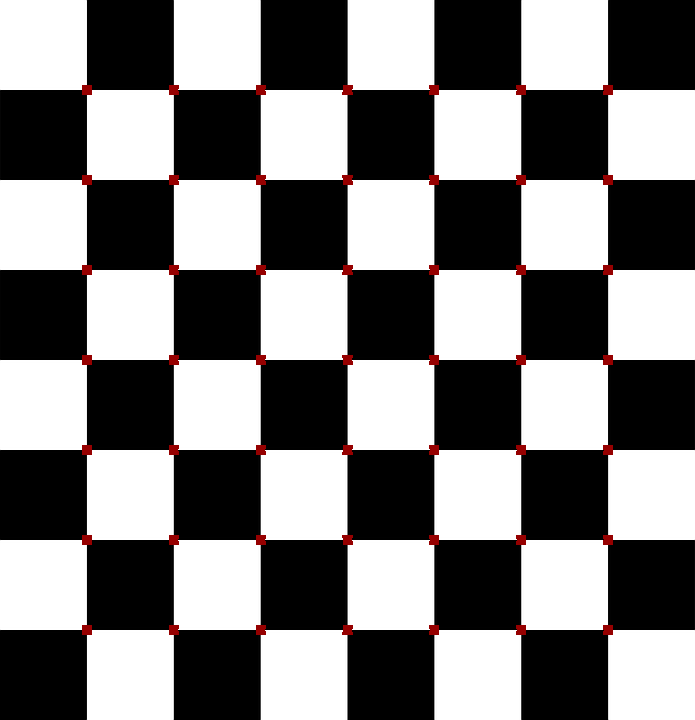

In [ ]:
#import library yang akan digunakan

import numpy as np
import cv2
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
import urllib.request

url = 'https://raw.githubusercontent.com/11SyamSM/amikom/main/gambar/papancatur.png'

req = urllib.request.urlopen(url)
img_arr = np.asarray(bytearray(req.read()), dtype=np.uint8)
im = cv2.imdecode(img_arr, cv2.IMREAD_COLOR)

abu=cv2.cvtColor(im,cv2.COLOR_BGR2GRAY)

abu=np.float32(abu)
dst = cv2.cornerHarris(abu,5,7,0.05)

#hasil dilebarkan untuk menandai sudut, tidak penting
dst = cv2.dilate(dst,None)

#Ambang batas untuk nilai optimal, dapat bervariasi tergantung gambar

im[dst>0.01*dst.max()]=[0,0,150]
cv2_imshow(im)


jumlah titik terdeteksi =  49


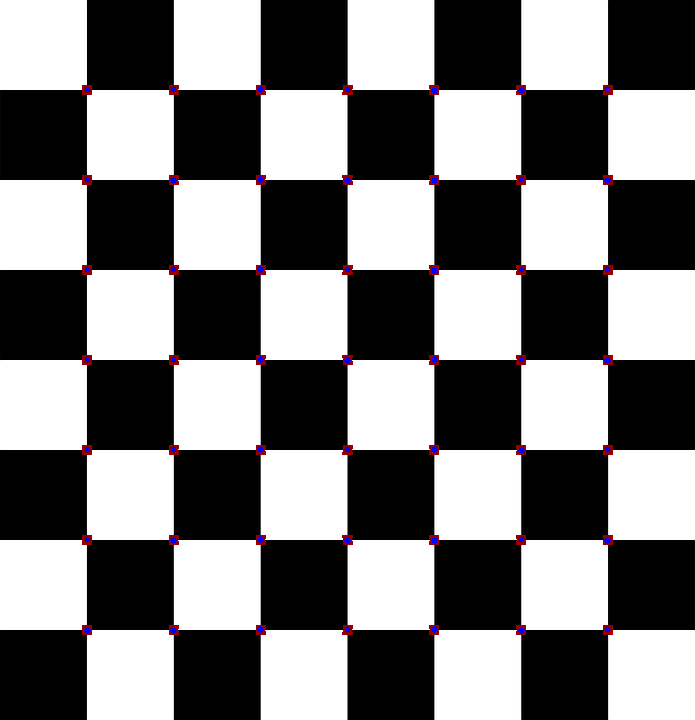

In [ ]:
sudut=cv2.goodFeaturesToTrack(abu,200,0.1,15)
sudut=np.int0(sudut)
print("jumlah titik terdeteksi = ", sudut.shape[0])

for i in sudut:
  x,y = i.ravel()
  cv2.circle(im,(x,y),3,255,-1)
cv2_imshow(im)



## 2) Matching Gambar

proses menggabungkan beberapa gambar yang tumpang tindih untuk membentuk sebuah gambar panoramik yang lebih besar. Tujuannya adalah untuk menciptakan sebuah gambar yang lebih luas, lebih detil, dan menampilkan sudut pandang yang lebih luas dibandingkan dengan gambar tunggal.

adapun tahapan-tahapan yang dilakukan untuk menggabungkan gambar diantaranya :


*   Deteksi titik-titik kunci pada setiap gambar
*   mencocokan titik-titik kunci di antara dua gambar yang bersebelahan
*   menghitung nilai feture menggunakan SHIFT (Scale-Invariant Feature Transform)
*   Melakukan Matching dari hasil deteksi keypoints menggunakan BruteForce Matcher

setelah dilakukan matching atau Penggabungan kedua gambar menjadi sebuah gambar **panoramik**

In [ ]:
#uninstall open cv bawaan
!pip uninstall opencv-python -y

Found existing installation: opencv-python 4.7.0.72
Uninstalling opencv-python-4.7.0.72:
  Successfully uninstalled opencv-python-4.7.0.72


In [ ]:
#downgrade open cv agar bisa menggunakan shift
!pip install opencv-contrib-python==3.4.17.61 --force-reinstall

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.2/63.2 MB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 72.1 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.22.4
    Uninstalling numpy-1.22.4:
      Successfully uninstalled numpy-1.22.4
  Attempting uninstall: opencv-contrib-python
    Found existing installation: opencv-contrib-python 4.7.0.72
    Uninstalling opencv-contrib-python-4.7.0.72:
      Successfully uninstalled opencv-contrib-python-4.7.0.72
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
imgaug 0.4.0 requires opencv-python, which is not installed.
dopamine-rl 4.0.6 requires opencv-python>=3.4.8.29, which is not installed.
tensorflow 2.12.0 requires numpy<1.24,>=1.22, but you ha

In [ ]:
#import library yang akan digunakan

import numpy as np
import cv2
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
figsize = (20,20) 

In [ ]:
img=cv2.imread ('/content/sample_data/IMG_2452.jpg')
img2=cv2.imread ('/content/sample_data/IMG_2453.jpg')

req = urllib.request.urlopen(url)
img_arr = np.asarray(bytearray(req.read()), dtype=np.uint8)
im = cv2.imdecode(img_arr, cv2.IMREAD_COLOR)

#resize
skala = 25

#mengukur skala dgn yg asli
lebar=int(img.shape[1]*skala/100)
panjang=int(img.shape[0]*skala/100)
lebar2=int(img2.shape[1]*skala/100)
panjang2=int(img2.shape[0]*skala/100)

ukuran=(lebar,panjang)
ukuran2=(lebar,panjang)

#HASIL
imresize=cv2.resize(img,ukuran)
imresize2=cv2.resize(img2,ukuran2)

rgb=cv2.cvtColor(imresize,cv2.COLOR_BGR2RGB)
rgb2=cv2.cvtColor(imresize2,cv2.COLOR_BGR2RGB)

abu=cv2.cvtColor(rgb,cv2.COLOR_BGR2GRAY)
abu2=cv2.cvtColor(rgb2,cv2.COLOR_BGR2GRAY)

jumlah titik terdeteksi=  2905
jumlah titik terdeteksi2=  2872


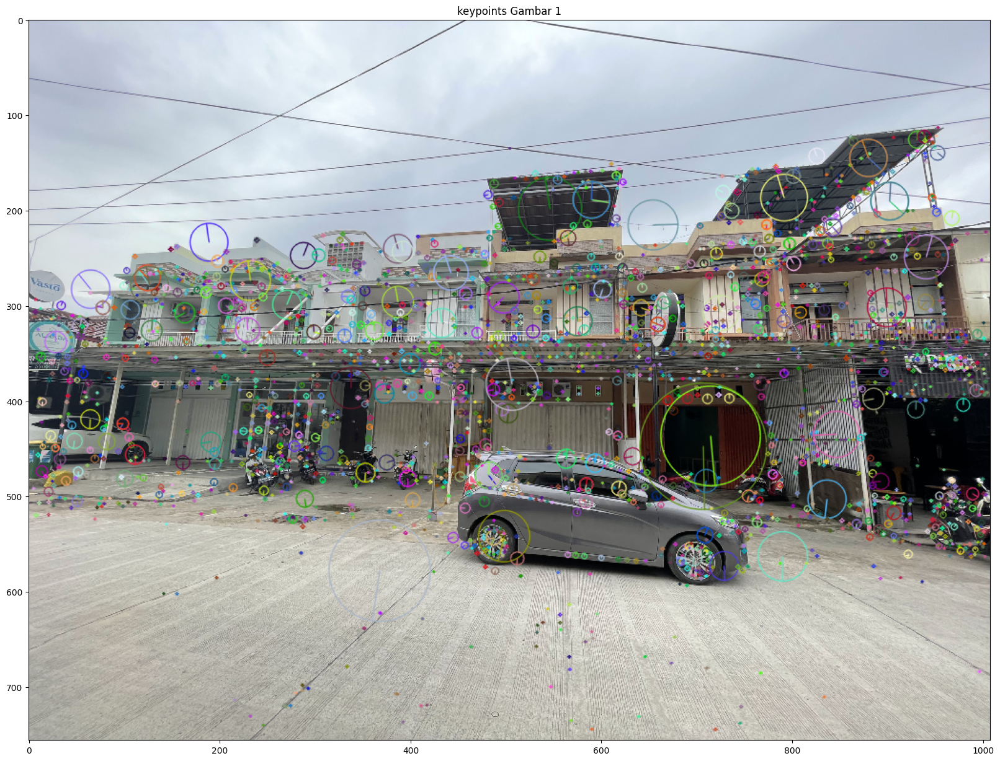

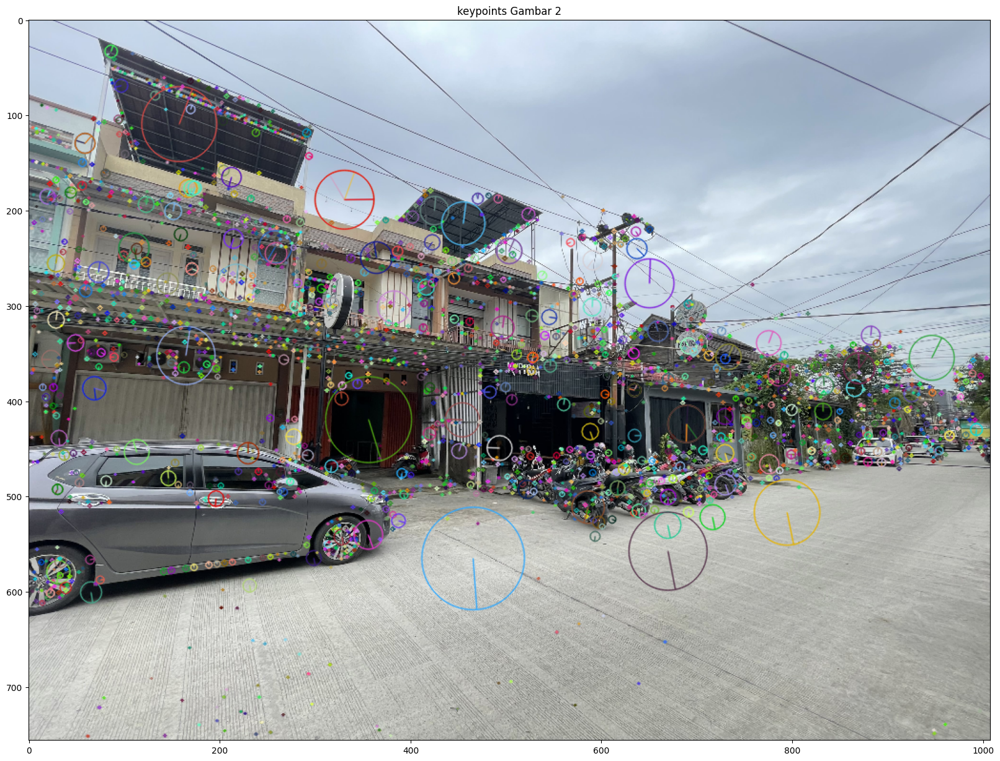

In [ ]:
#Menghitung feature dengan SHIFT
sift = cv2.xfeatures2d.SIFT_create()
kp, des = sift.detectAndCompute(abu, None)
kp2, des2 = sift.detectAndCompute(abu2, None)

#berapa jumlah titik terdeteksi?
print("jumlah titik terdeteksi= ", len(kp))
print("jumlah titik terdeteksi2= ", len(kp2))
                                  
#memnggambar keypoint yangberhasil diidentifikasi
img3 = cv2.drawKeypoints(rgb,kp,None,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img4 = cv2.drawKeypoints(rgb2,kp2,None,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=figsize)
plt.imshow(img3)
plt.title("keypoints Gambar 1")
plt.show()

plt.figure(figsize=figsize)
plt.imshow(img4)
plt.title("keypoints Gambar 2")
plt.show()

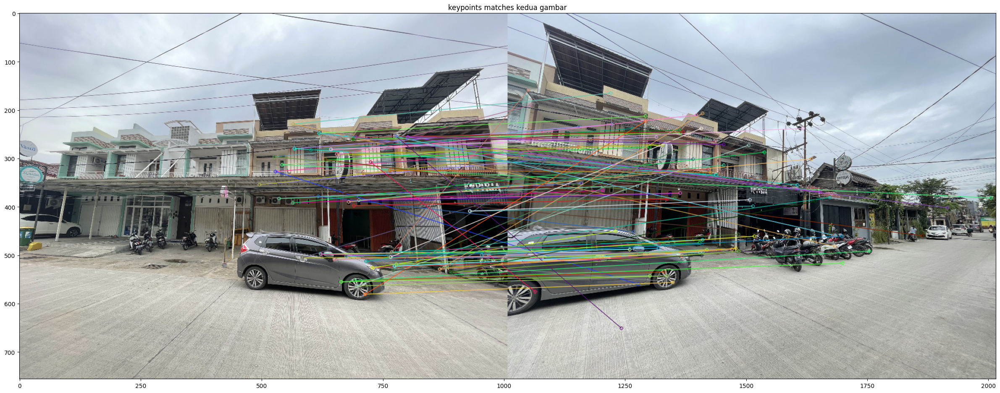

In [ ]:
#Melakukan Matching dari hasil deteksi keypoints menggunakan BruteForce Matcher
bf = cv2.BFMatcher()
matches = bf.knnMatch(des, des2, k=2)

#uji rasio Matching
good_and_second_good_match_list = []
for m in matches:
  if m[0].distance/m[1].distance<0.5:
    good_and_second_good_match_list.append(m)
good_match_arr = np.asarray(good_and_second_good_match_list)[:,0]

#hasil pencocokan
im_matches = cv2.drawMatchesKnn(rgb, kp, rgb2, kp2, good_and_second_good_match_list[0:60], None, flags=2)

plt.figure(figsize=(30,30))
plt.imshow(im_matches)
plt.title("keypoints matches kedua gambar")
plt.show()

In [ ]:
good_kp = np.array([kp[m.queryIdx].pt for m in good_match_arr])
good_kp2 = np.array([kp2[m.trainIdx].pt for m in good_match_arr])
H, masked = cv2.findHomography(good_kp2, good_kp, cv2.RANSAC, 5.0)

print(H)

[[-9.09388178e-02 -2.44127972e-02  4.51095746e+02]
 [-4.51093870e-01  5.59765079e-01  1.77697338e+02]
 [-1.03999972e-03 -1.23555715e-04  1.00000000e+00]]


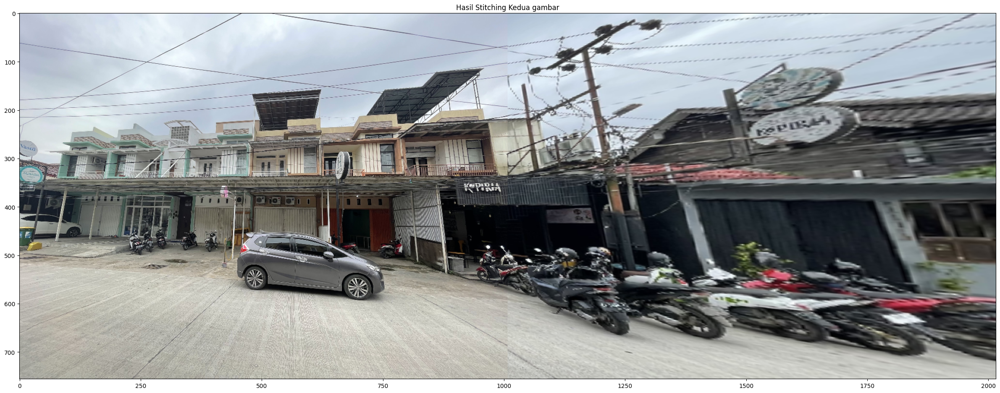

In [ ]:
rgb_r_warped = cv2.warpPerspective(rgb2, H, (rgb.shape[1]+ rgb2.shape[1], rgb.shape[0]))
rgb_r_warped[0:rgb.shape[0], 0:rgb.shape[1]] = rgb

plt.figure(figsize=(30,30))
plt.imshow(rgb_r_warped)
plt.title("Hasil Stitching Kedua gambar")
plt.show()

##  3) Corner Detection Video

Corner detection pada video dapat dilakukan dengan menerapkan teknik deteksi sudut seperti Harris Corner Detector, Shi-Tomasi Corner Detector, atau FAST Corner Detector pada setiap frame video.

Untuk setiap frame video, deteksi sudut akan dilakukan untuk mengidentifikasi sudut-sudut pada frame tersebut. Selanjutnya, dapat dilakukan pelacakan sudut (corner tracking) di antara frame-frame video untuk mendapatkan informasi tentang gerakan sudut dari waktu ke waktu

deteksi sudut pada video dapat menjadi proses yang cukup memakan waktu dan memerlukan sumber daya yang cukup besar. 

### a. Harris Corners Detector Video

Harris Corner Detector adalah teknik deteksi sudut pada gambar dan video yang sangat populer dan efektif. Harris Corner Detector bekerja dengan menghitung perbedaan intensitas pada sebuah piksel ketika digeser sedikit pada berbagai arah. Kemudian, perbedaan intensitas ini digunakan untuk menghitung responsivitas sudut pada setiap piksel. Pada daerah sudut, perbedaan intensitas cenderung besar dalam setiap arah dan responsivitas sudut akan memiliki nilai maksimum.

Proses Harris Corner Detector pada video melibatkan deteksi sudut pada setiap frame video secara terpisah dan kemudian dilakukan pelacakan sudut (corner tracking) di antara frame-frame video. Proses ini akan menghasilkan informasi tentang pergerakan sudut dari waktu ke waktu

*dilatihan ujicoba ini saya menggunakan Tools Visual Studio Code karena ketika saya menggunakan Google Coolab ada beberapa perintah tidak berjalan dan memerlukan waktu yang cukup lama, kemungkinan Masalah dengan library atau modul yang digunakan Masalah dengan kompatibilitas versi, dalam artian Google Colab masih Sangat terbatas*

In [ ]:
import cv2
import numpy as np

cam = cv2.VideoCapture(0)
cam.set(3,640) 
cam.set(4,480)

while True:
    retV, frame = cam.read()
    abu = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    abu = np.float32(abu)
    dst = cv2.cornerHarris(abu, 6, 21, 0.1)

    dst = cv2.dilate(dst, None)

    frame[dst > 0.09 * dst.max()] = [0, 0, 255]
    cv2.imshow("layar", frame)
    
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cam.release()
cv2.destroyAllWindows()

apabila di runing maka akan muncul sebuah video dan bertanda titik merah


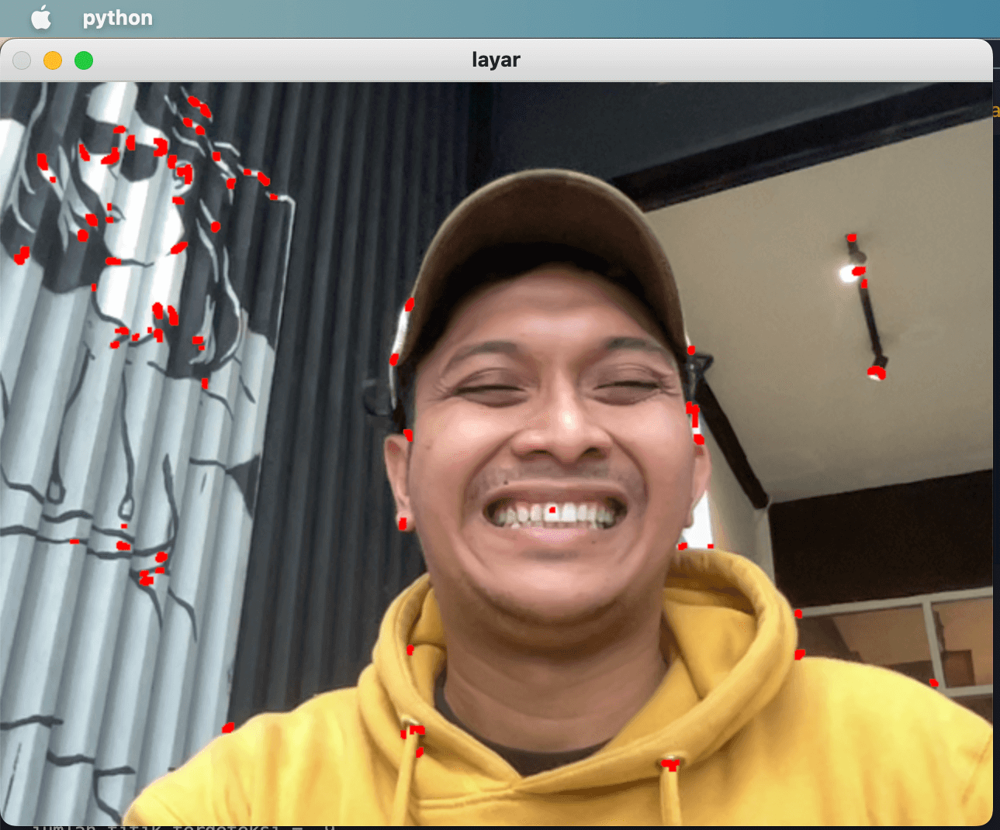


noted : *mohon untuk menjalankannya menggunakan VSCode*

### b. Shitomasi Detection

Hampir serupa dengan Harris Corner Detector, **Shi-Tomasi Corner Detector** adalah teknik deteksi sudut pada gambar dan video yang menurut saya  lebih efisien dan akurat dalam deteksi sudut pada video.

Proses Shi-Tomasi Corner Detector yaitu dengan melakukan deteksi sudut pada setiap frame video secara terpisah dan kemudian dilakukan pelacakan sudut (corner tracking) di antara frame-frame video. Proses ini akan menghasilkan informasi tentang pergerakan sudut dari waktu ke waktu.



sama dengan kasus Haris Corner Detector latihan ujicoba ini saya menggunakan Tools Visual Studio Code.

In [ ]:
#Mengimpor library OpenCV dan NumPy yang dibutuhkan oleh program.
import cv2
import numpy as np

#Membuat objek cam dari class cv2.VideoCapture() untuk membuka kamera atau webcam yang tersambung pada komputer. Angka 0 pada parameter cv2.VideoCapture(0) menunjukkan bahwa kita akan menggunakan kamera default.
cam = cv2.VideoCapture(0)
cam.set(3, 640)  # ubah Lebar camera
cam.set(4, 480)  # ubah tinggi camera

#Loop utama untuk terus membaca frame dari kamera dan mendeteksi sudut pada setiap frame.
while True:
    #Membaca frame terbaru dari kamera dan mengembalikan dua nilai
    retV, frame = cam.read()
    #konversi frame menjadi Grayscale
    abu = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    #menjalankan fungsi algoritma Shimotasi
    sudut = cv2.goodFeaturesToTrack(abu, 30, 0.5, 1)
    #Mengkonversi nilai koordinat sudut yang awalnya berupa float menjadi integer
    sudut = np.intp(sudut)
    #menampilkan jumlah titik yang terdeteksi
    print("jumlah titik terdeteksi = ", sudut.shape[0])

    #Loop untuk setiap titik sudut yang berhasil terdeteksi.
    for i in sudut:
        #proses pembentukan objek lingkaran berdasarkan posisinya
        x, y = i.ravel()
        cv2.circle(frame, (x, y), 8, 255, -1)
        #Menampilkan frame dengan sudut yang telah terdeteksi pada jendela "layar"
        cv2.imshow("layar", frame)
    #Menunggu tombol keyboard ditekan. Jika tombol 'q' ditekan, maka program akan keluar dan menutup
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cam.release()
cv2.destroyAllWindows()

apabila di runing maka akan muncul sebuah video dan bertanda titik biru yang menandakan jumlah titik yang terdeteksi.

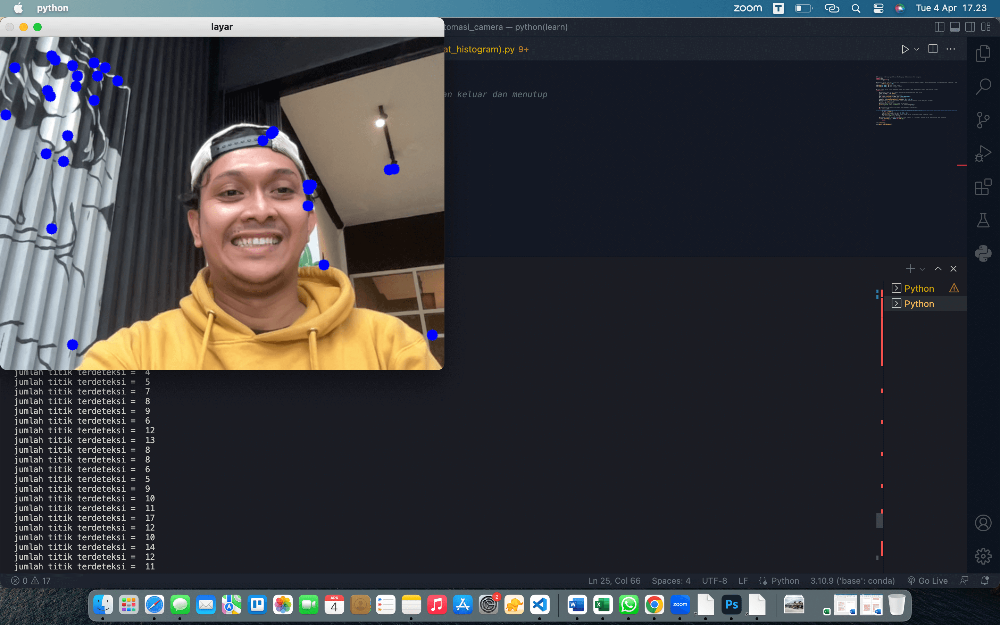

noted : *mohon untuk menjalankannya menggunakan VSCode*

# Penutup

sekian Laporan Latihan minggu ini tentang Feature, Finding Corner & Invariance saya buat, 


semoga kita selalu diberikan kesehatan dan kemudahan dalam menjalankan aktivitas. amin.



Salam Hormat,
**Syamsul Syahab Mangun | 22.55.2292**